# Intro

## Machine Learning

A general overview that I liked from a video in this course describes machine learning as:
- We have a problem (car not starting)
- We have this box of tools (algorithms) that are used to fix various problems (hammer, wrench, axe, etc.)
- We have these other "measurement tools" (evaluation metrics) to evaluate how effective a tool would be in fixing our issue. Once we decide what tool (alg) is best, we get after solving the problem

## Categories of ML

- Supervised learning - training with labeled data in order to be able to label unlabeled data.
  - Classification - predict categorical outcomes (detecting evil, detecting dog breed, etc.). There can be more than 2 possible outcomes for classification
  - Regression - predict numeric outcomes
- Unsupervised learning
- Reinforcement learning

## Scikit-learn

Popular FOSS library for supervised or unsupervised learning.

## Ethics in ML

Real-world data holds errors and biases, so the models will as well.

If humans create the data, there will inherently be bias. Keep this on your mind when building out a model.

Real world validation of models is vital, even more so that statistical validation.

# Linear Regression (Predicting Values)

Regression answers "how much"

The highest level of regression is LR. It's based around the idea of fitting (drawing) a line through a dataset plotted on a graph.

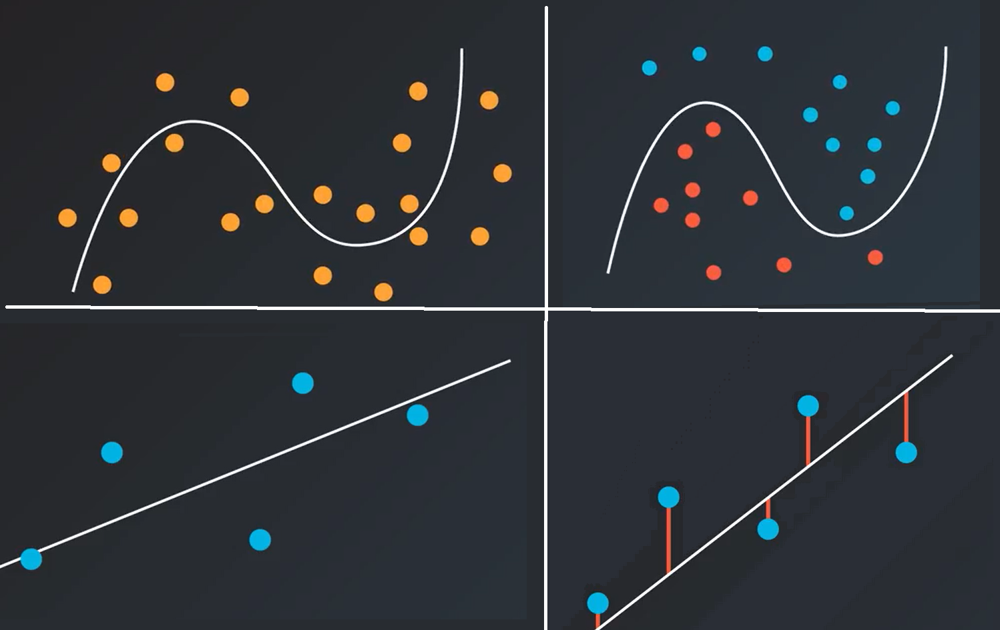

## Fitting a line

Draw a line and ask each point what it waants

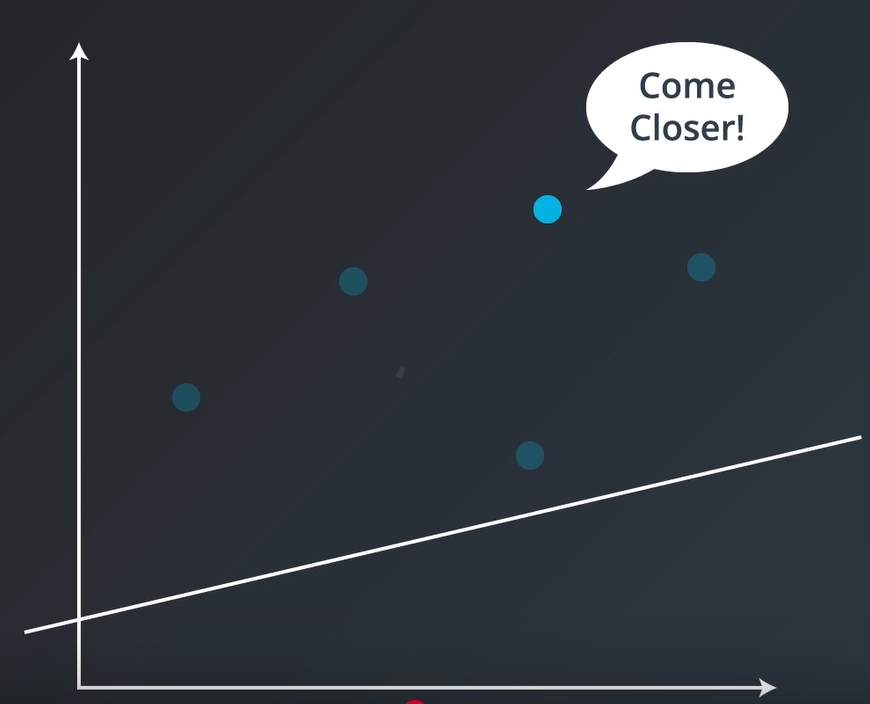

Then we keep doing that over and over

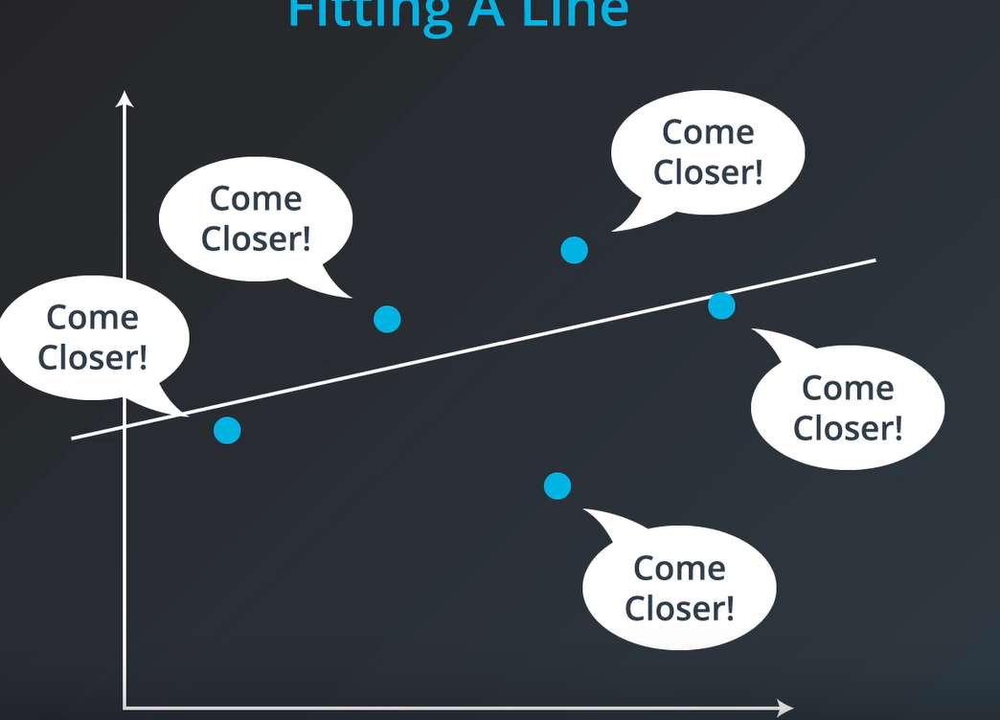

And eventually, the line will be as close as possible to every point.

### Moving a Line

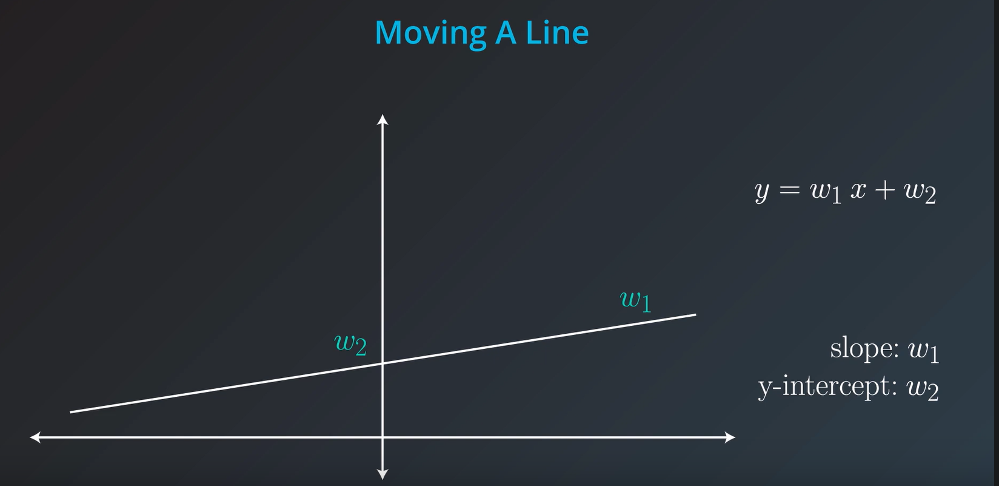

If we increase the slope, or $w_{1}$, we will cause the angle to steepen. If we just increase the y-intercept, or $w_{2}$, we will translate the entire line upward by that amount.

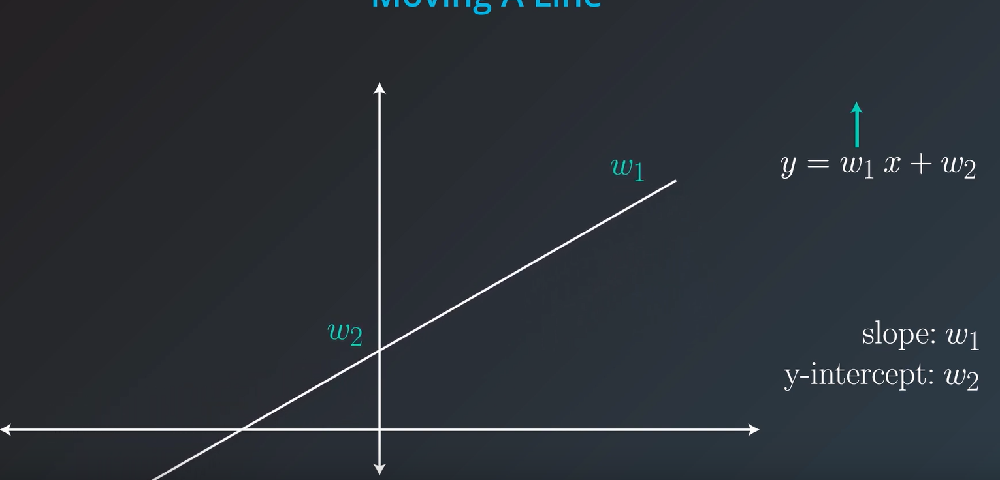

Note: this one was also after a decrease to the slope was applied. But yeah, changing the y-intercept will cause the line to move paralell in that direction

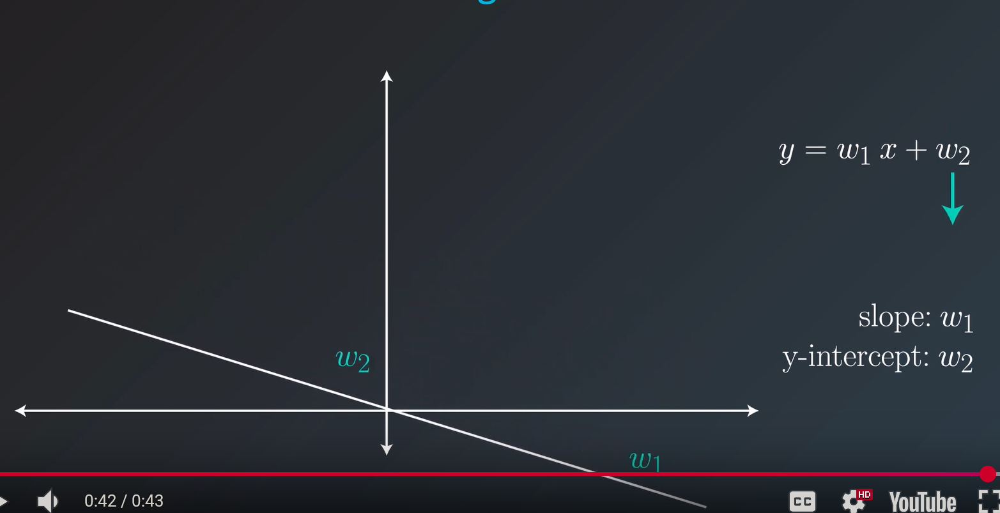

### Absolute Trick

- Start with a point and a line
- Point wants line to come closer to it at location $(p, q)$. 
- Line is represented as $y = w_{1}x + w_{2}$
- The trick has two steps
  1. Add to the y-intercept ($w_{2}$) so the line moves up (or subtract if it needs to go down)
  2. Add to the slope ($w_{1}$) to make the line rotate in the direction of the point

If the point is above the line, one of the first steps that could be take would be just adding one to the y-int and $p$ to the slope, giving us:
$$y = (w_{1} + p)x + (w_{2} + 1)$$

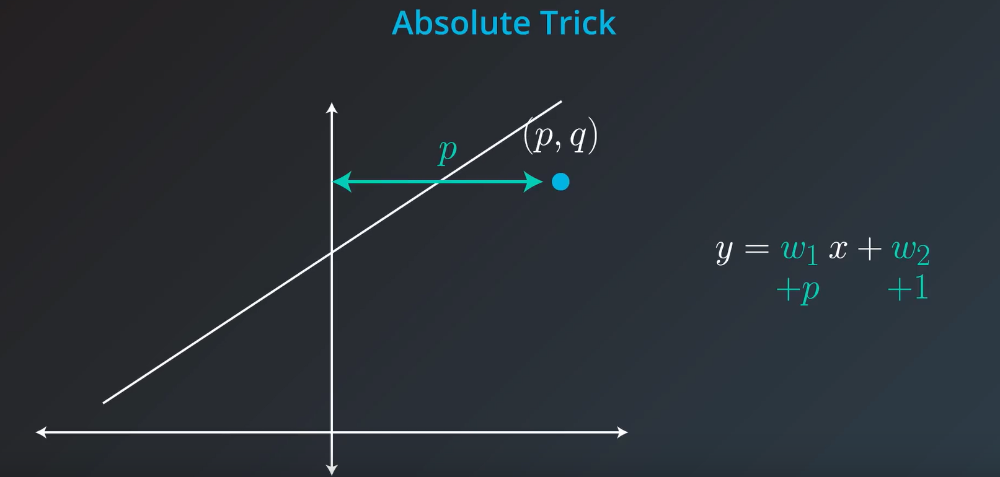


The line was moved too much, so we need to take tinier steps. We do this by applying a learning rate ($a$, in this case)

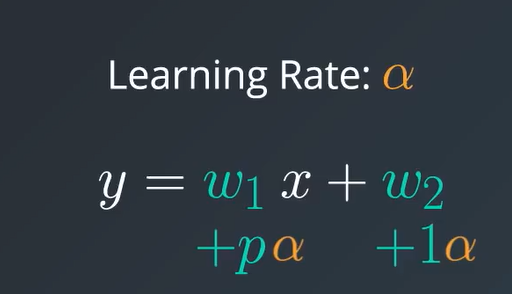

This would make our new equation:
$$y = (w_{1} + pa)x + (w_{2} + a)$$

If the point is under the line, we just subtract instead, and get
$$y = (w_{1} - pa)x + (w_{2} - a)$$

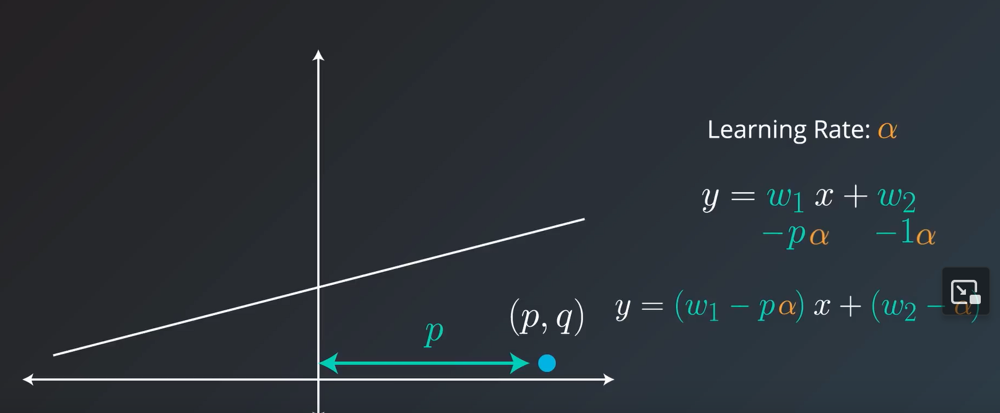

If we now have a point that is above, but to the left of the line, we still do the same thing as moving it up and to the right, but bear in mind that $p$ will be a negative number, so the slope's angle will decrease.

$$y = (w_{1} + pa)x + (w_{2} + a)$$

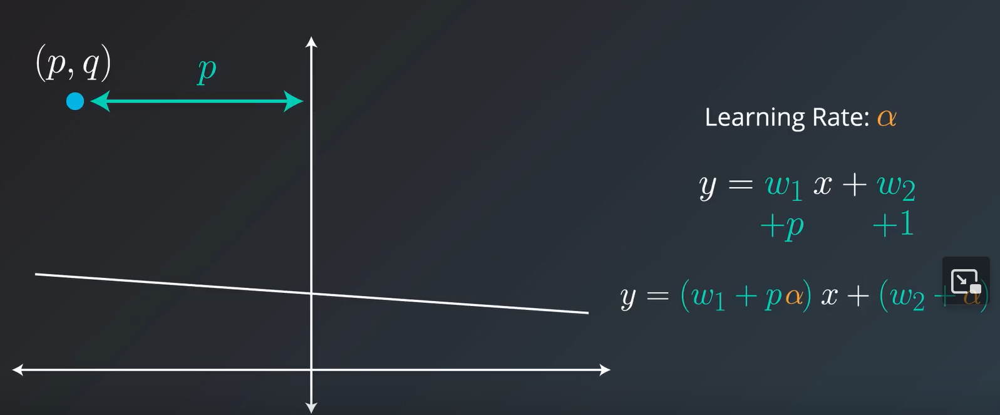

Here is an example using actual numbers

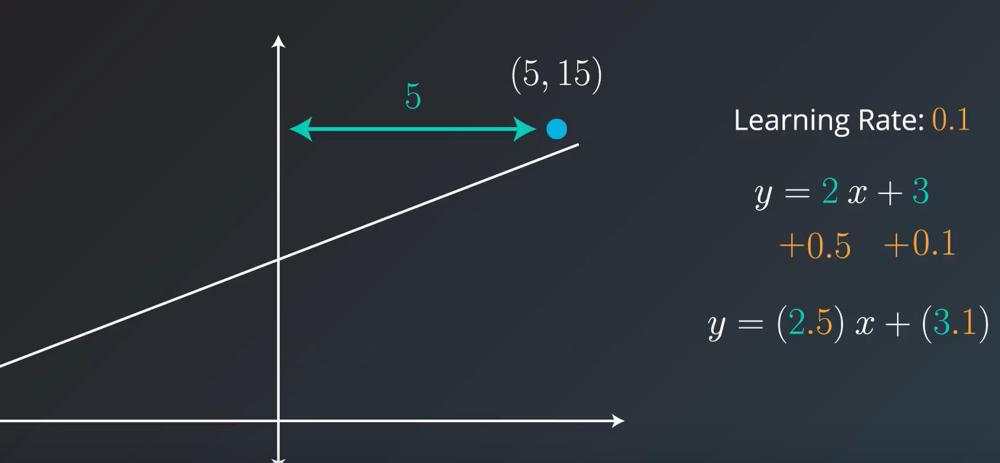

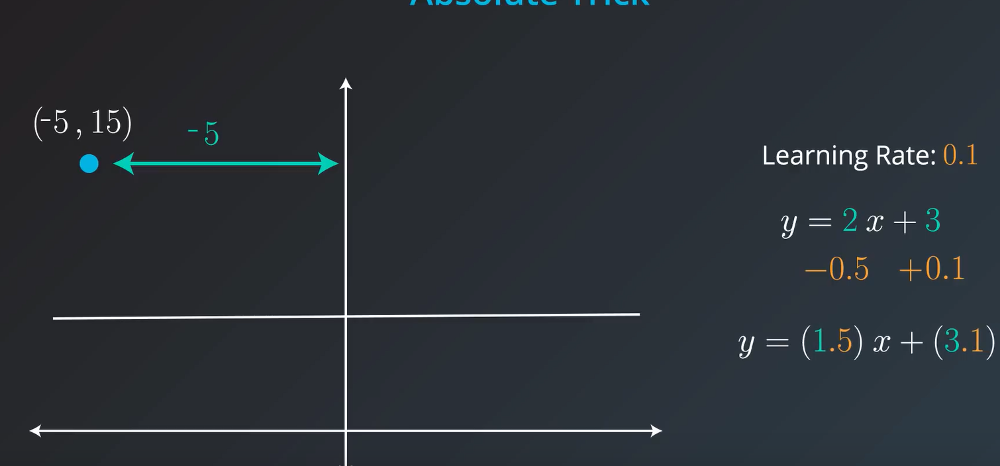

#### Practice: 

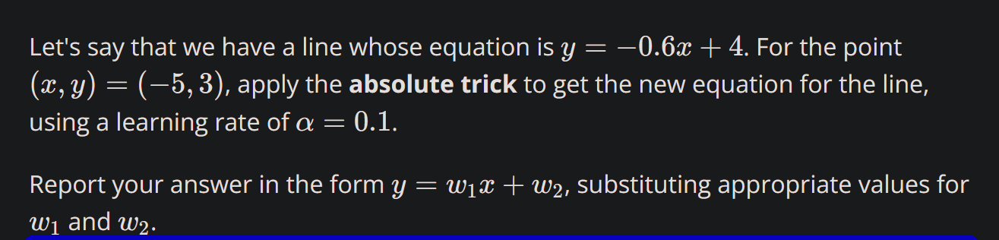

Because the y-int is 4 and the point's y coord is 3, the dot we want to get to is to the left and below the line

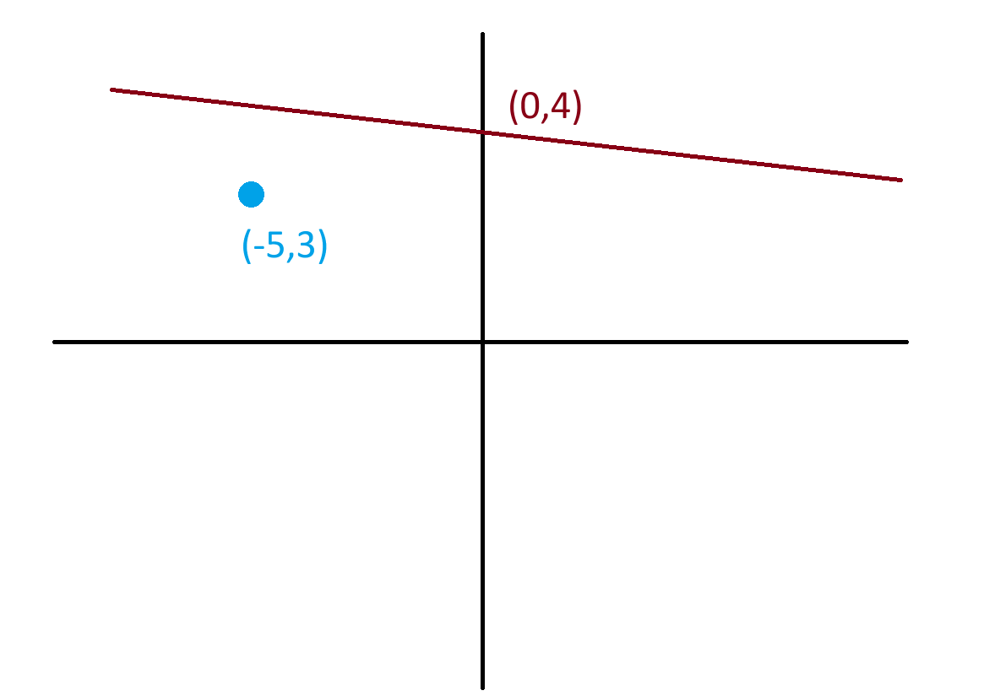

Plug and chug, subtracting because we want to move : 

$y = (-0.6+pa)x + (4-a)$

$y = (-0.6-(-5)(0.1))x + (4-0.1)$

$y = (-0.6 - -0.5)x + 3.9$

$y = (-0.6 + 0.5)x + 3.9$

$y = -0.1x + 3.9$

### Square Trick

Another way to move a point closer to the line. The abs trick will move the line by a constant value without factoring in how far the point is, but the square trick *WILL* factor it in because it is now caring about the vertical distance between the target point and the line to be moved.

We are now just adding the vertical distance to the formula we got from the absolute trick

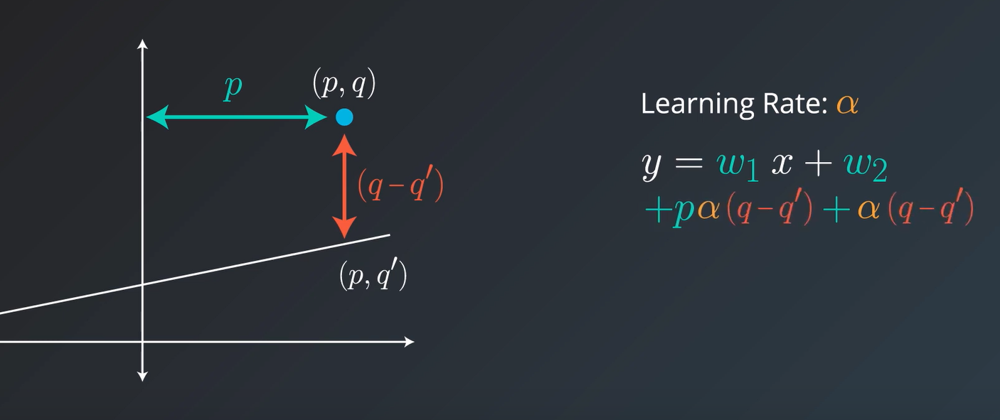

It makes sense that it would be $q - q\prime$ (Q-Prime) since calculating the distance between those points, which is the amount you need to move, would be done as such.

Our equation now becomes:

$$y = (w_{1} + p(q - q\prime)a)x + (w_{2} + (q - q\prime)a)$$

This also takes care of points that are under the line, since $q - q\prime$ will be a negative number

Example with real numbers, note that the number in red is a result of $p * (q - q\prime)$:

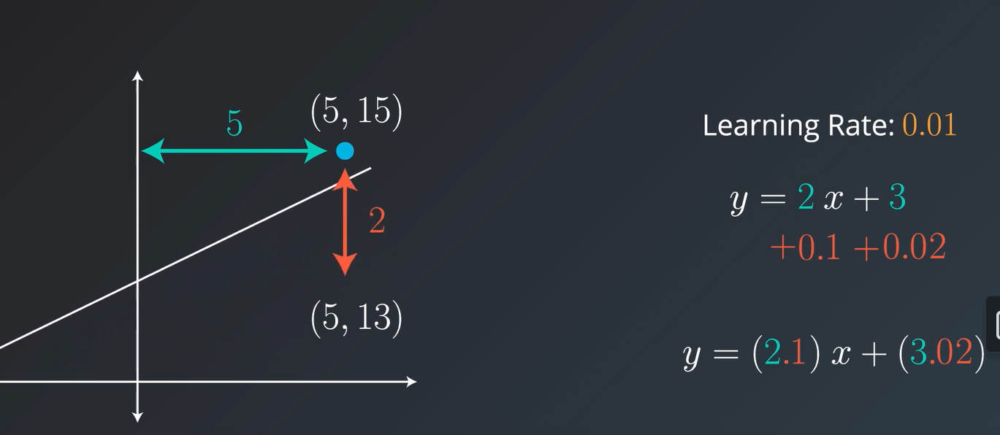






#### Example

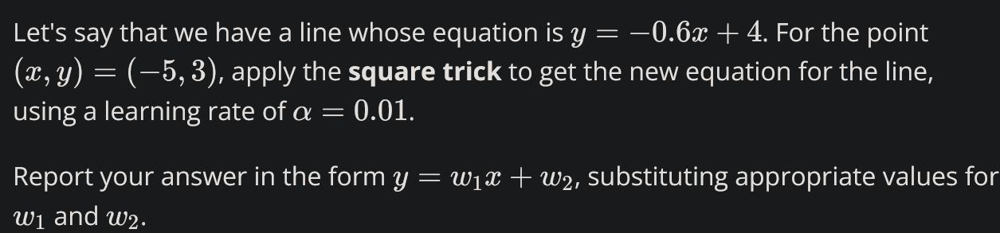


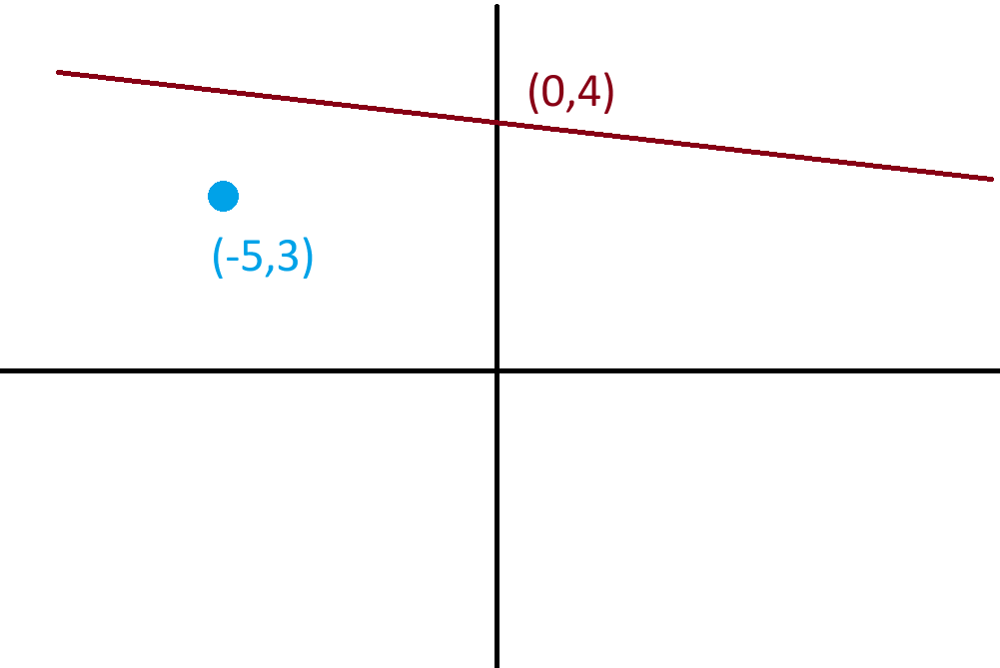

Calculate $q\prime$:
- $y = -0.6(-5) + 4$
- $y = 3+4$
- $y = 7 = q\prime$

$(q-q\prime) = (3-7) = -4$

Substitute
- $y = (-0.6 + -5(-4).01)x + (4 + -4(.01))$
- $y = (-0.6 + .2)x + (4 - .04)$$
- $y = -0.4x + 3.96$$

### Gradient Descent

Essentially, decreasing error (or distance from points) until ya can't -> algorithmically

Algorithm
- draw a random line amidst points and calculate the total error (distance from points)
- Move the line to see if the error can be decreased
- Repeat over and over again until all changes result in increasing error
- kinda like a sorting algorithm, in a way.

Mathematically
- It's complicated, but essentially:

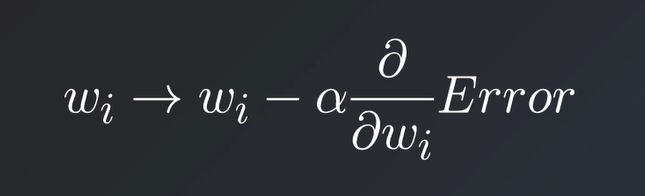

To descend from a mountain, we need to minimize our height/distance from ground elevation. If we are going down the mountain, in this case at least, we check each direction we can take, the commit to the one that will take us furthest down the mountain. We then re-assess, working our way down the mountainside.

[This is a very helpful video](https://www.youtube.com/watch?v=4s4x9h6AN5Y)

#### Mean Absolute Error

- A function for calculating error -> this is how we find out what "the number" is so we can keep making it smaller
- We draw our predicted line
- We find the distance from a point
- We add it to the sum of errors (absolute values of the errors, at least)
- Repeat 
- Once all errors sum, divide by the number of errors (find the mean)

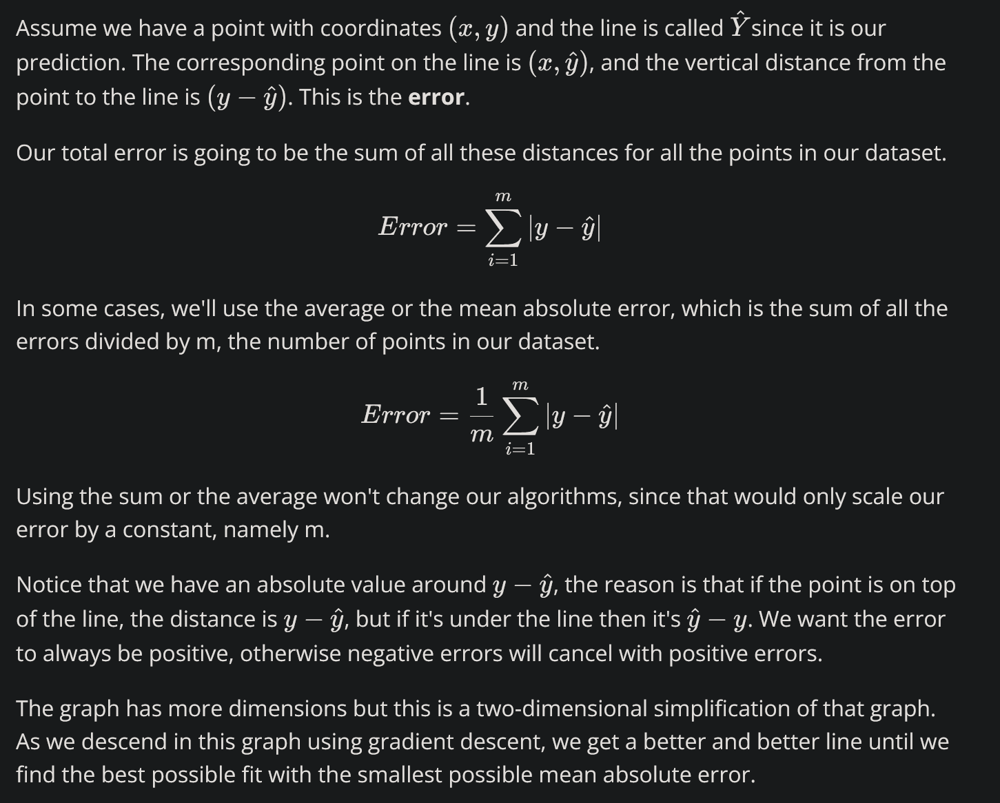

#### Mean Squared Error

Similar to Mean Absolute Error, but this is a quadratic function, therefore the minimum point is in the middle

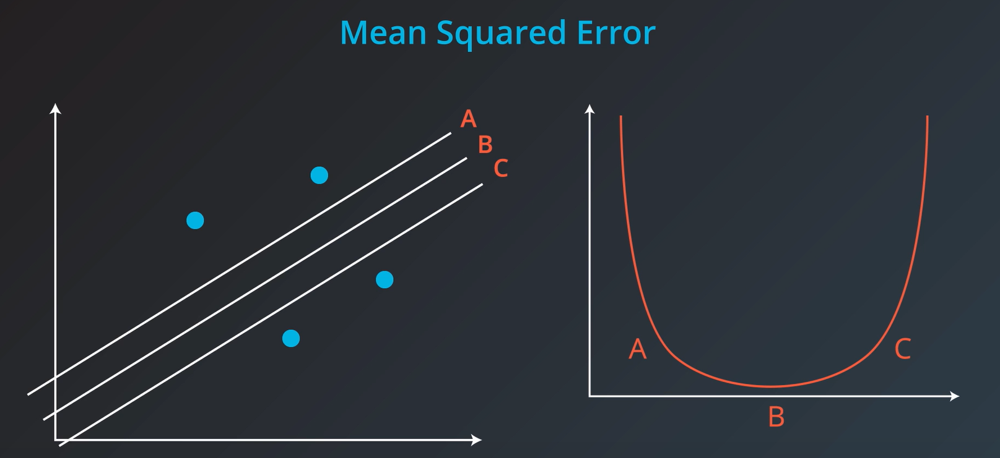

Instead of taking the distance, we draw a square

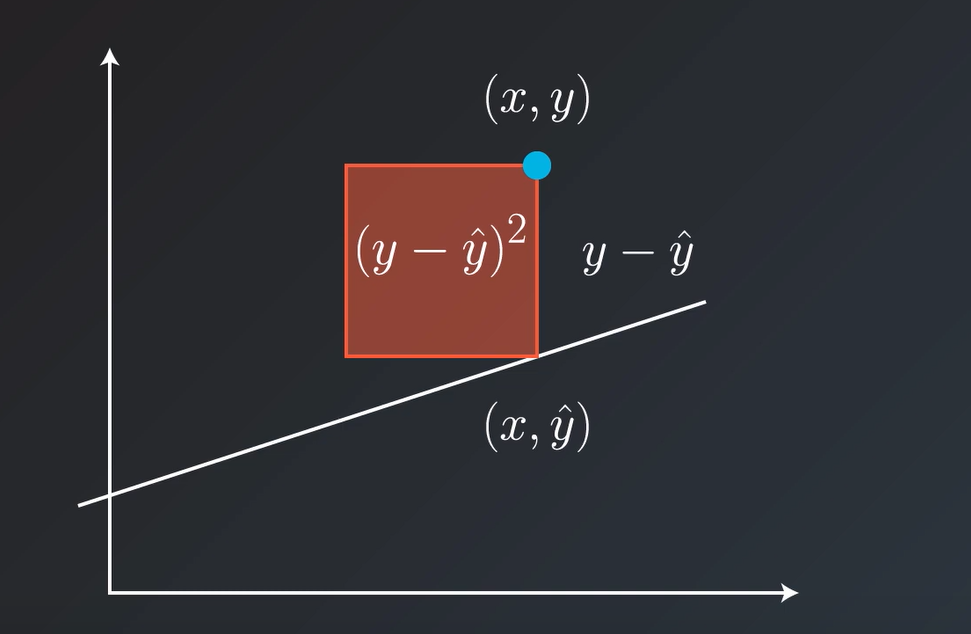

The area of that square is always $(y-\hat{y})^2$

Because the number is being squared, it is always positive, since it's either a + times a + or - times a -

Then we sum all the areas of the squares, then we find the mean. We factor in $1/2$ for convenience as well, as we are taking the derivative of the error later (help)


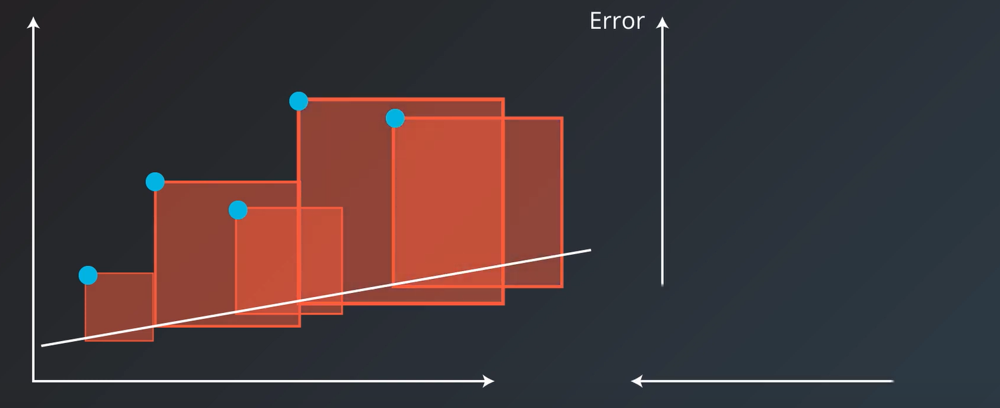

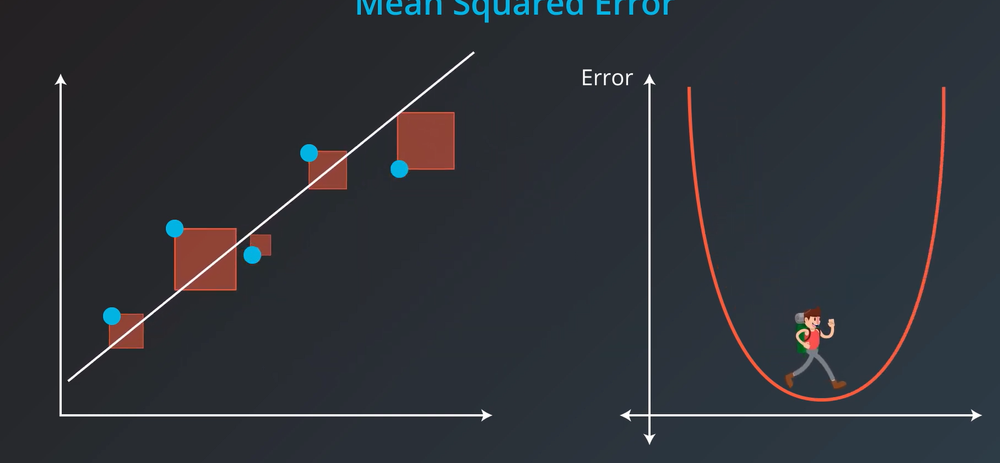

#### Minimizing Error Functions vs Tricks

This is effectively one of the tricks.

Square trick == mean squared error

Absolute trick == mean absolute error

Wow.

### Batch vs. Stochastic Gradient Descent

Two ways to go about fitting a line with/via/using/idkhelpme linear regression:
- Apply the squared/absolute trick at every point one by one, repeating this many times
- Doing that, but to all of the points at the same time

The former is known as **stochastic gradient descent** (one point at a time) and the latter is known as **batch gradient descent** (all points at a time)

Neither of these are the best or most used, as they are SLOW computationally, especially with a ton of data. Enter *mini-batch gradient descent*

#### Mini-batch Gradient Descent

The best way to do linear regression is this way
- Split your data into many small batches
- Each batch should be roughly the same # of points
- Use each batch to update your weights

Now for some code!!

In [26]:
import numpy as np
import matplotlib.pyplot as plt

In [27]:
np.random.seed(42)

In [28]:
def MSEStep(X, y, W, b, learn_rate = 0.005):
    """
    This function implements the gradient descent step for squared error as a
    performance metric.
    
    Parameters
    X : array of predictor features
    y : array of outcome values
    W : predictor feature coefficients
    b : regression function intercept
    learn_rate : learning rate

    Returns
    W_new : predictor feature coefficients following gradient descent step
    b_new : intercept following gradient descent step
    """
    
    # TODO: compute errors
    y_pred = np.matmul(X, W) + b
    error = y - y_pred
    
    # TODO: compute steps
    W_new = W + learn_rate * np.matmul(error, X)
    b_new = b + learn_rate * error.sum()
    
    return W_new, b_new

In [29]:
# The gradient descent step will be performed multiple times on
# the provided dataset, and the returned list of regression coefficients
# will be plotted.

def miniBatchGD(X, y, batch_size = 20, learn_rate = 0.005, num_iter = 25):
    """
    This function performs mini-batch gradient descent on a given dataset.

    Parameters
    X : array of predictor features
    y : array of outcome values
    batch_size : how many data points will be sampled for each iteration
    learn_rate : learning rate
    num_iter : number of batches used

    Returns
    regression_coef : array of slopes and intercepts generated by gradient
      descent procedure
    """
    n_points = X.shape[0]
    W = np.zeros(X.shape[1]) # coefficients
    b = 0 # intercept
    
    # run iterations
    regression_coef = [np.hstack((W,b))]
    for _ in range(num_iter):
        batch = np.random.choice(range(n_points), batch_size)
        X_batch = X[batch,:]
        y_batch = y[batch]
        W, b = MSEStep(X_batch, y_batch, W, b, learn_rate)
        regression_coef.append(np.hstack((W,b)))
    
    return regression_coef


In [30]:
# Import data from CSV file
data = np.loadtxt('./datasets/gd_data.csv', delimiter = ',')
X = data[:,:-1]
y = data[:,-1]

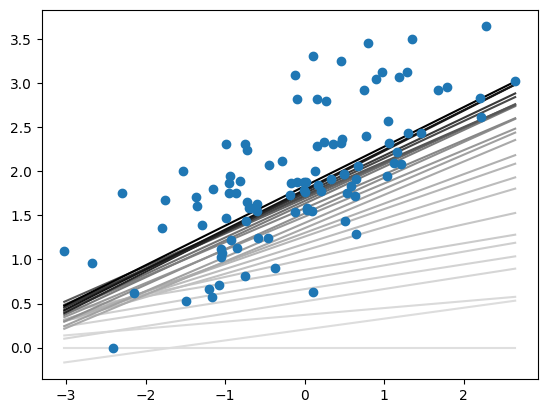

In [31]:
regression_coef = miniBatchGD(X, y)

# Plot the regression coefficient
plt.figure()
X_min = X.min()
X_max = X.max()
counter = len(regression_coef)
for W, b in regression_coef:
    counter -= 1
    color = [1 - 0.92 ** counter for _ in range(3)]
    plt.plot([X_min, X_max],[X_min * W + b, X_max * W + b], color = color)
plt.scatter(X, y, zorder = 3)
plt.show()

## Playing with Linear Regression in scikit

Predicting life expectancy from BMI.

Using the `LinearRegression` class using the `fit()` method to fit the model to our data. 

```python
>>> from sklearn.linear_model import LinearRegression
>>> model = LinearRegression()
>>> model.fit(x_values, y_values)  # get line of best fit
```

Then we can make some predictions based on the line we just fitted.

```python
>>> print(model.predict([ [127], [248] ]))  # array of arrays
[[ 438.94308857, 127.14839521]]
```

For each input array, a prediction was returned as an element in an array.

Linear Regression Quiz

In this quiz, you'll be working with data on the average life expectancy at birth and the average BMI for males across the world. The data comes from [Gapminder](https://www.gapminder.org/).

The data file, "bmi_and_life_expectancy.csv", includes three columns, containing the following data:
- Country – The country the person was born in.
- Life expectancy – The average life expectancy at birth for a person in that country.
- BMI – The mean BMI of males in that country.

You'll need to complete each of the following steps:

1. Load the data
    - The data is in the file called "`bmi_and_life_expectancy.csv`".
    - Use pandas `read_csv` to load the data into a dataframe (don't forget to import pandas!)
    - Assign the dataframe to the variable `bmi_life_data`.

2. Build a linear regression model
    - Create a regression model using scikit-learn's `LinearRegression` and assign it to `bmi_life_model`.
    - Fit the model to the data.

3. Predict using the model
    - Predict using a BMI of 21.07931 and assign it to the variable `laos_life_exp`.

In [32]:
from sklearn.linear_model import LinearRegression
import pandas as pd

In [33]:
bmi_life_data = pd.read_csv('./datasets/bmi_and_life_expectancy.csv')

In [38]:
bmi_life_data.head()

,Country,Life expectancy,BMI
0,Afghanistan,52.8,20.62058
1,Albania,76.8,26.44657
2,Algeria,75.5,24.59620
3,Andorra,84.6,27.63048
4,Angola,56.7,22.25083


In [35]:
bmi_life_model = LinearRegression()
bmi_life_model.fit(X=bmi_life_data[['BMI']], y=bmi_life_data[['Life expectancy']])

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [37]:
laos_life_exp = bmi_life_model.predict([[21.07931]])
print(laos_life_exp)

[[60.31564716]]


C:\Users\Ethan\AppData\Roaming\Python\Python310\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


## Higher Dimensions

Predicting housing price based on size is a 2-dimensional problem, but we can achieve n-dimensions, really.

Price $ = w_{1}($ size $) + w_{2} $

In the case of 3 dimensions, our equation will look as such

Price $ = w_{1}($ school quality $) + w_{2} ( $ size $ ) + w_{3} $

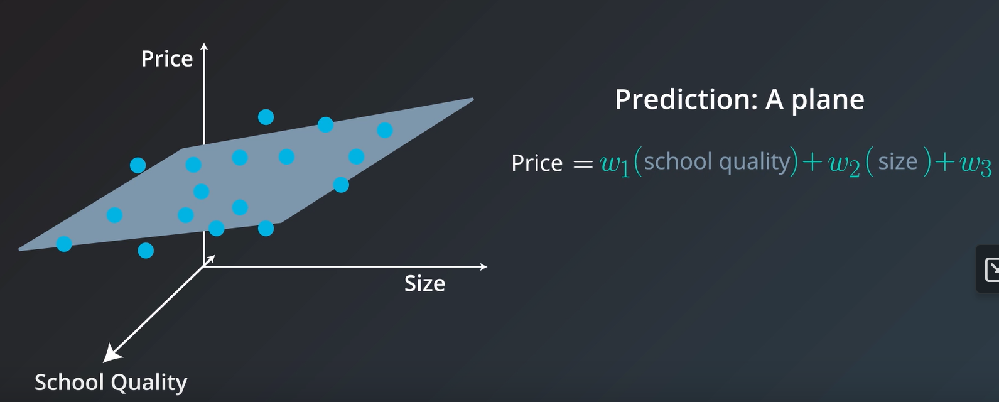

In $n$ dimensional space...
- $\hat{y} = w_{1}x_{1} + w_{2}x_{2} + ... + w_{n-1}x_{n-1} + w_{n}$
- Multiple inputs, one output ($\hat{y}$)
- It's just a linear equation, but with n variables.


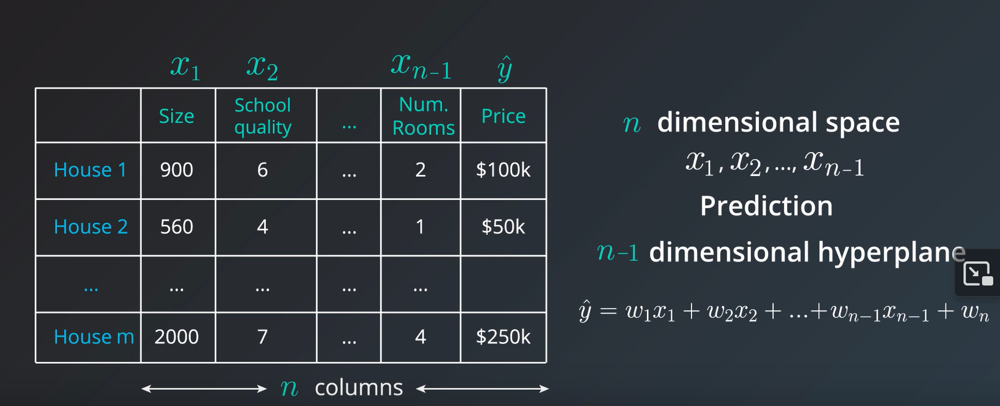


We can still apply the tricks, calc the mean absolute/square errors, and minimize using gradient descent

## Multiple Linear Regression

**Predictor** - independent variable

**Prediction** - dependent variable

More dimensions are harder to visualize, but we can still fit lines the same.

In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.datasets import fetch_california_housing

housing = fetch_california_housing()

In [43]:
x = housing.data
y = housing.target

In [44]:
model = LinearRegression()
model.fit(x, y)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [55]:
sample_house = [[8.3252,
                 41.,
                 6.98412698,
                 1.02380952,
                 322.,
                 2.55555556,
                 37.88,
                 -122.23]]

model.predict(sample_house)

array([4.13164983])

## Closed Form Solution

 To minimize the mean squared error, we do not need to use gradient descent or tricks.


## Linear Regression Warnings

- Works best when the data is linear
  - only a straight line is made witht the model from training data
  - if it's not linear, transform your data, add features, or use a different model
- Sensitive to outliers


# Polynomial Regression

Similar algo to linear reg, but we work with equations that are like this:

$$\hat{y} = w_{1}x^3 + w_{2}x^2 + w_{3}x + w_{4}$$

We just take the mean absolute or squared error + take derivatives w/ respect to the four variables, and the same goes for gradient descent - we modify the four weights in order to minimize the error

In [56]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

In [57]:
train_data = pd.read_csv('./datasets/data.csv')

In [58]:
train_data.head()

,Var_X,Var_Y
0,-0.33532,6.66854
1,0.02160,3.86398
2,-1.19438,5.16161
3,-0.65046,8.43823
4,-0.28001,5.57201


In [67]:
x = np.reshape(train_data['Var_X'], (20, 1))  # reshape into a 2D array that's 20 rows x 1 col
y = np.reshape(train_data['Var_Y'], (20, 1))

In [68]:
x, y

(array([[-0.33532],
        [ 0.0216 ],
        [-1.19438],
        [-0.65046],
        [-0.28001],
        [ 1.93258],
        [ 1.2262 ],
        [ 0.74727],
        [ 3.32853],
        [ 2.87457],
        [-1.48662],
        [ 0.37629],
        [ 1.43918],
        [ 0.24183],
        [-2.7914 ],
        [ 1.08176],
        [ 2.81555],
        [ 0.54924],
        [ 2.36449],
        [-1.01925]]),
 array([[  6.66854],
        [  3.86398],
        [  5.16161],
        [  8.43823],
        [  5.57201],
        [-11.1327 ],
        [ -5.31226],
        [ -4.63725],
        [  3.8065 ],
        [ -6.06084],
        [  7.22328],
        [  2.38887],
        [ -7.13415],
        [  2.00412],
        [  4.29794],
        [ -5.86553],
        [ -5.20711],
        [ -3.52863],
        [-10.16202],
        [  5.31123]]))

In [71]:
poly_feat = PolynomialFeatures(degree=4)  # why? idk.
x_poly = poly_feat.fit_transform(x)

In [80]:
poly_model = LinearRegression(fit_intercept=False).fit(x_poly, y)
# idk why we aren't fitting the intercept

In [81]:
print(f"Coefficients: {poly_model.coef_}")
print(f"Intercept: {poly_model.intercept_}")

Coefficients: [[ 3.37563501 -6.28126025 -2.3787942   0.55307182  0.22699807]]
Intercept: 0.0


# Regularization

A technique to improve models and make sure they do not overfit 

Training to minimize error - the error will be minimized by the model. The line makes a couple of errors with the blue dot below and the red dot above, while the polynomial curve makes no mistakes, but is much more complicated.

Complex models have larger error than a simple model. If we start adding coefficients of the line to its error, we get one that's a bit larger for the line, but much much greater for the polynomial.

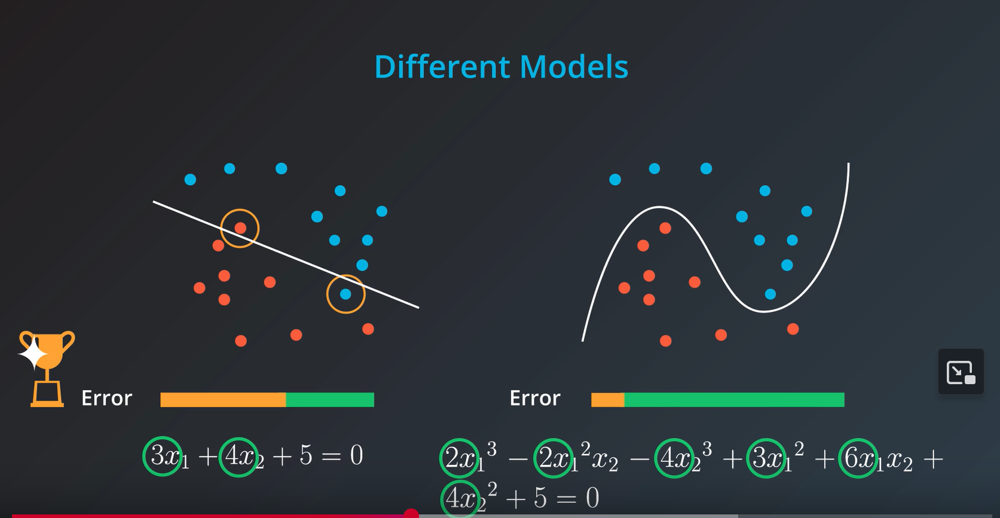

L1 Regularization takes the absval of the coeffs and adds them to the error

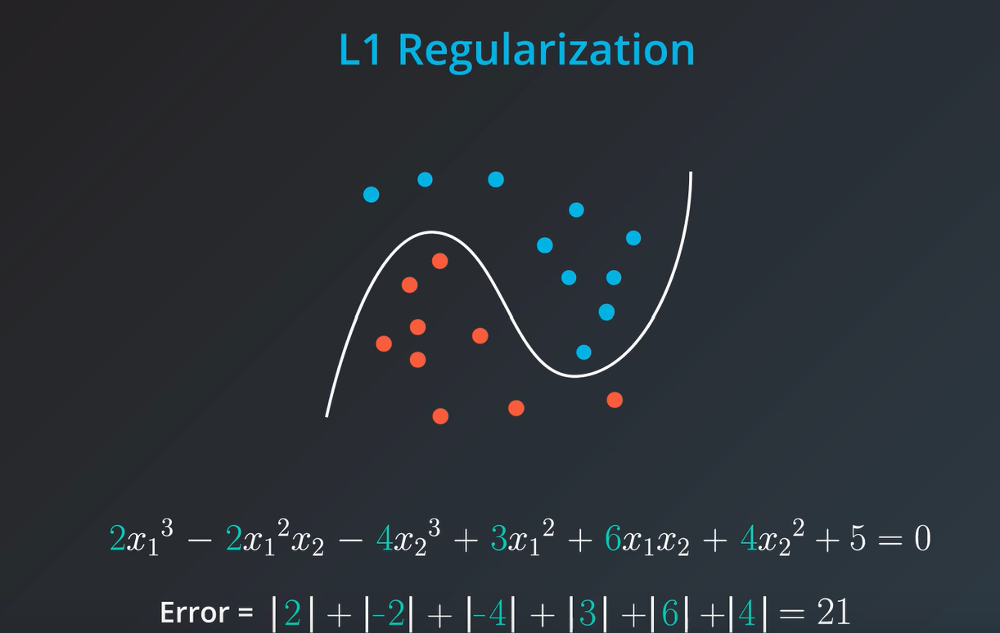

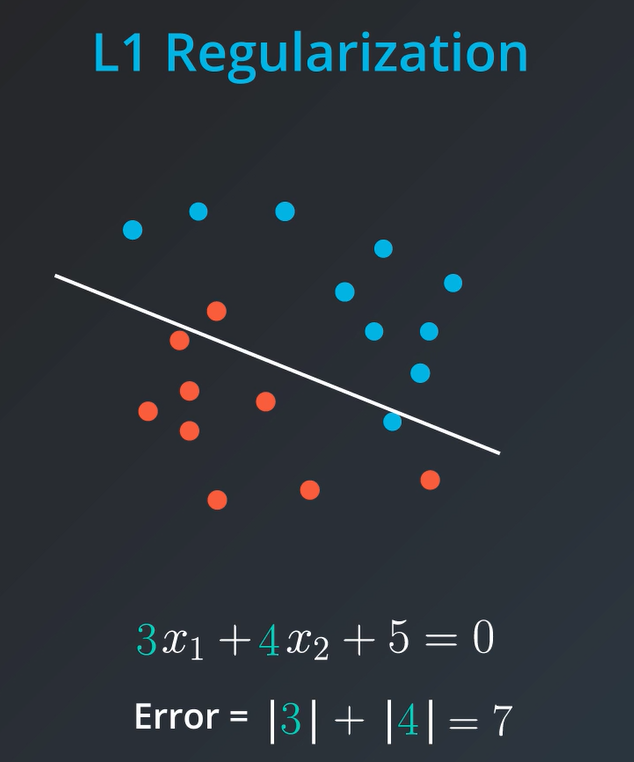

L2 Regularization adds the squares of the coeffs instead of the absvals 

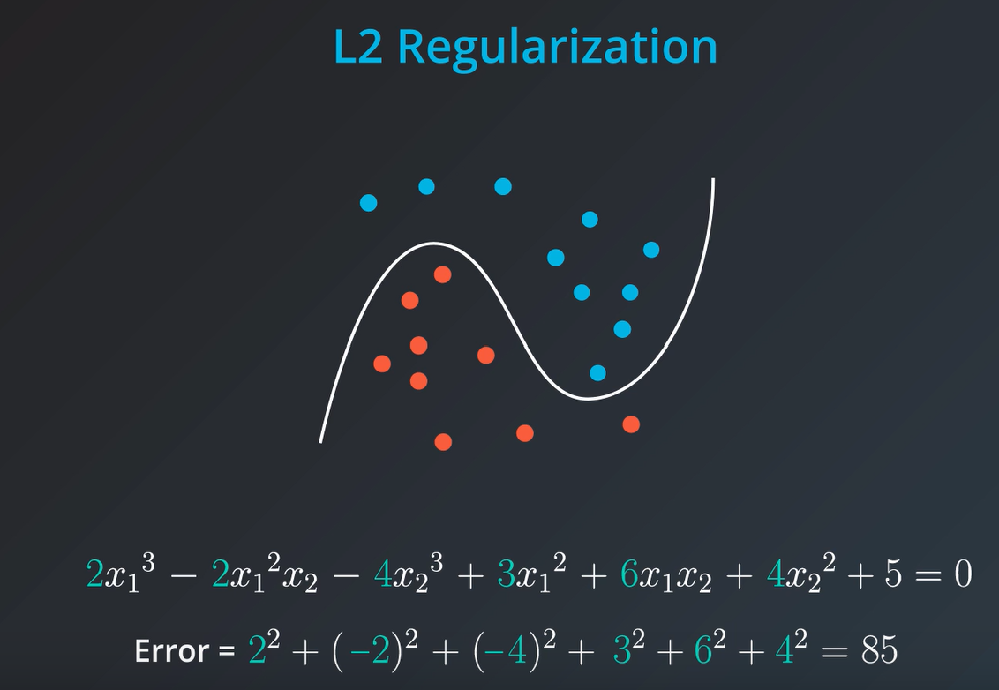

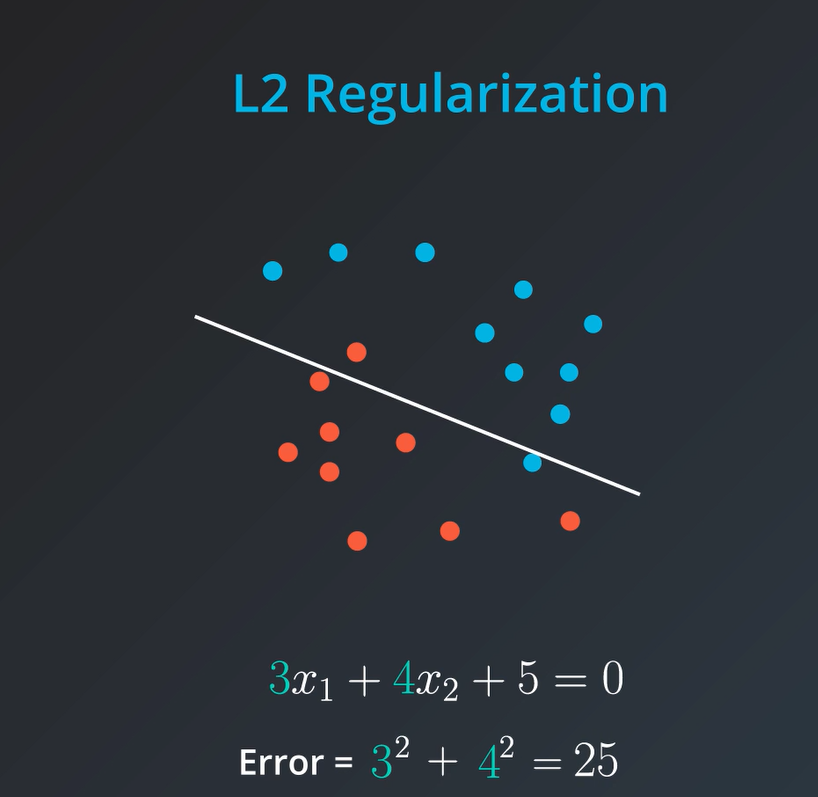

We can adjust how much punishment we place on model complexity if we value having the least amount of error possible

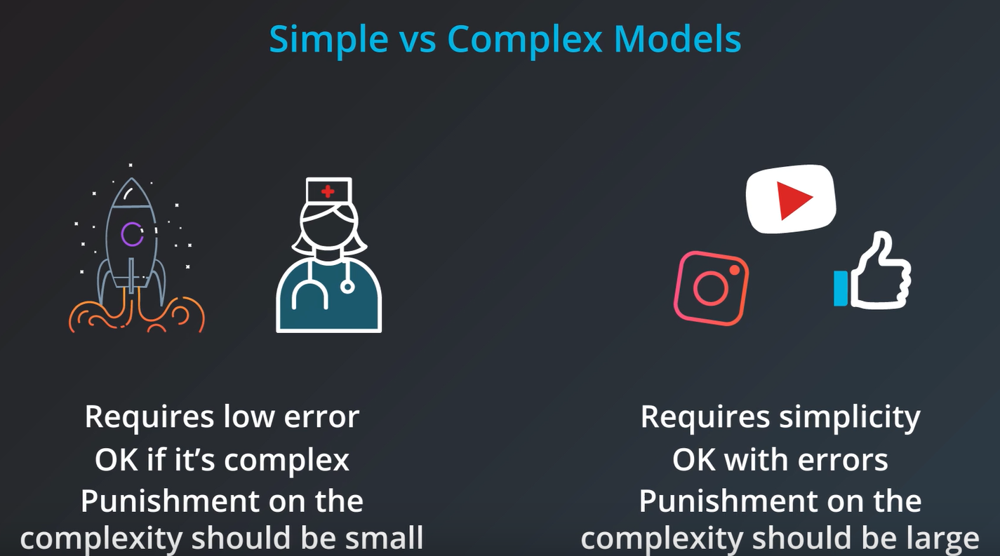



We tune our amount of punishment with a parameter called lambda ($\lambda$)

Using $\lambda$, we multiply the error that comes from the complexity (summ of coeffs) to adjust the overall error
- Small value: error is not large enough to overtake the errors in the simplified model misclassifying points, so the better option is the complex model
- Large value (lots of punishment): multiplying the complexity part (or magnifying it) by a lot, therefore the simple model wins.

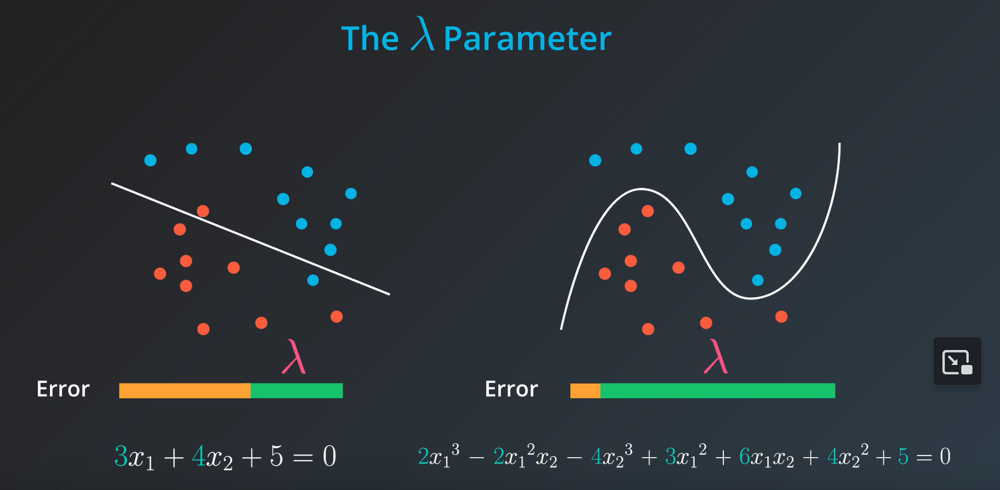

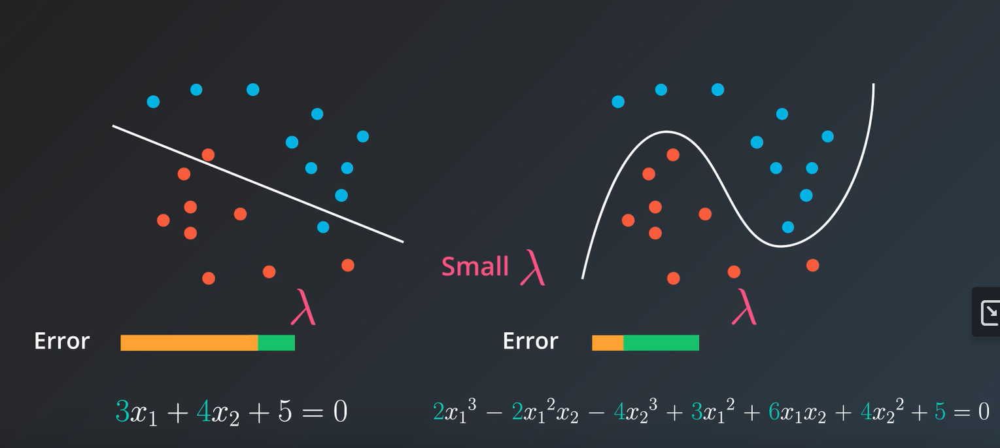

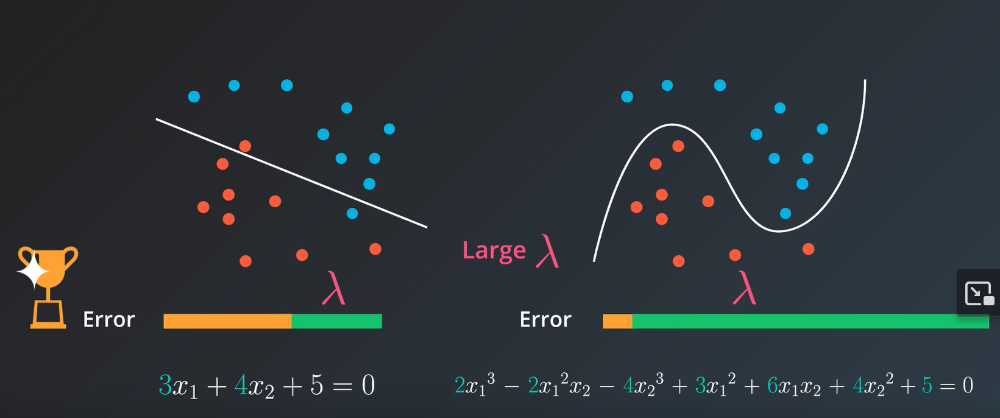

Cheatsheet

| L1 Regularization | L2 Regularization|
|-------------------|------------------|
| Computationally inefficient (unless sparse data) | Computationally efficient | 
| Sparse outputs | Non-sparse outputs/data more equally distributed |
| Feature selection | No feature selection (treats all cols the same) |

We can perform regularization with sklearn's `Lasso` class

In [ ]:
from sklearn.linear_model import Lasso, LinearRegression
import pandas as pd
import numpy as np

In [84]:
train_data = pd.read_csv('./datasets/data_no_header.csv', header=None)

In [ ]:
train_data.head()  # predictors (x) are in 0-5, last is y (outcome)

,0,1,2,3,4,5,6
0,1.25664,2.04978,-6.23640,4.71926,-4.26931,0.20590,12.31798
1,-3.89012,-0.37511,6.14979,4.94585,-3.57844,0.00640,23.67628
2,5.09784,0.98120,-0.29939,5.85805,0.28297,-0.20626,-1.53459
3,0.39034,-3.06861,-5.63488,6.43941,0.39256,-0.07084,-24.68670
4,5.84727,-0.15922,11.41246,7.52165,1.69886,0.29022,17.54122


In [104]:
x = train_data.iloc[:, 0:-1]
y = train_data.iloc[:, -1]

In [108]:
x, y

(           0        1         2        3        4        5
 0    1.25664  2.04978  -6.23640  4.71926 -4.26931  0.20590
 1   -3.89012 -0.37511   6.14979  4.94585 -3.57844  0.00640
 2    5.09784  0.98120  -0.29939  5.85805  0.28297 -0.20626
 3    0.39034 -3.06861  -5.63488  6.43941  0.39256 -0.07084
 4    5.84727 -0.15922  11.41246  7.52165  1.69886  0.29022
 ..       ...      ...       ...      ...      ...      ...
 95  -4.58240 -1.27825   7.55098  8.83930 -3.80318  0.04386
 96 -10.00364  2.66002  -4.26776 -3.73792 -0.72349 -0.24617
 97  -4.32624 -2.30314  -8.16044  4.46366 -3.33569 -0.01655
 98  -1.90167 -0.15858 -10.43466  4.89762 -0.64606 -0.14519
 99   2.43213  2.41613   2.49949 -8.03891 -1.64164 -0.63444
 
 [100 rows x 6 columns],
 0     12.31798
 1     23.67628
 2     -1.53459
 3    -24.68670
 4     17.54122
         ...   
 95    26.14768
 96     0.76214
 97   -10.05262
 98   -19.63970
 99    12.76193
 Name: 6, Length: 100, dtype: float64)

In [ ]:
lasso_reg = Lasso()
lasso_reg.fit(x, y)

reg_coef = lasso_reg.coef_
reg_coef

array([ 0.        ,  2.35793224,  2.00441646, -0.05511954, -3.92808318,
        0.        ])

In [110]:
# first and sixth cols are 0'd, which was done by the lasso regularization
# What does it look like before regularization with just a linreg?

l = LinearRegression()
l.fit(x, y)
l.coef_

array([-6.19918532e-03,  2.96325160e+00,  1.98199191e+00, -7.86249920e-02,
       -3.95818772e+00,  9.30786141e+00])

## Feature Scaling

A way to transform data into a common range of values - two common scalings
- Standardizing 
  - Take each value...
  - Subtract the mean of that column...
  - Then divide by the **standard** deviation of the col. 
  - We can interpret this value as the number of standard deviations the original height is from the mean.
  - Most common technique

```python
df['height_std'] = (df['height'] - df['height'].mean()) \
                   / df['height'].std()
```

- Normalizing
  - Data is scaled b/w 0 and 1, which can be done in the following way:

  ```python
  df['height_norm'] = (df['height'] - df['height'],min()) /    \
                      (df['height'].max() - df['height'].min())
  ```

### When to use

In ML algs, the result will change depending on the units of your data:
  1. Alg uses distance-based metric to predict
  2. When you incorporate regularization

#### Dist-based Metrics
One common supervised learning technique is based on distance between points (called Support Vector Machines (SVMs)).

Another technique is k-nearest neighbors (k-nn). 

Choosing not to scale data may lead to drastically different and misleading ending predictions. Choose some sort of feature scaling with distance-based techniques

#### Regularization
With regularization, you'll want to use feature scaling with your model. The penalty on coefficients in regularized linear regressions depends on the scale of the features.

When one features is on a very small range (0-10) and another on a very large (0-1mil), the feature with the small range will be unfairly punished because they will need larger coefficients compared to large ranges, or at least to have a similar outcome of the data.

In order to remove error, applying regularization would mean that the small-ranged feature would likely be removed, since that would lead to the most impact on punishment.

Feature scaling can also speed up convergence of ML algs.

https://www.quora.com/Why-do-we-normalize-the-data

**Now onto an exercise**

In [115]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
import pandas as pd

In [116]:
train_data = pd.read_csv('./datasets/data_no_header.csv', header=None)

x = train_data.iloc[:, :-1]
y = train_data.iloc[:, -1]

In [ ]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)  # standardize predictor values 

# Linreg with lasso regularization
lasso_reg = Lasso()
lasso_reg.fit(x_scaled, y)
# remember that we want to use feature scaling when regularizing
# in this case, we are standardizing over normalizing


# Get the model's coefficients
reg_coef = lasso_reg.coef_
reg_coef  # now the 1st and 4th cols are 0, not the 1st and 6th.

array([  0.        ,   3.90753617,   9.02575748,  -0.        ,
       -11.78303187,   0.45340137])

## Glossary

| Key Term | Definition |
|---|---|
| Batch gradient descent | The process of repeatedly calculating errors for all points at the same time and updating weights accordingly. |
| Error | The vertical distance from a given point to the predictive line. |
| Feature scaling | Transforming data into a common range of values using standardizing or normalizing. |
| Gradient descent | The reduction of the error by taking the derivative of the error function with respect to the weights. |
| L1 Regularization | Absolute values of the coefficients of the model are used for regularization. |
| L2 Regularization | Squares of the values of the coefficients of the model are used for regularization. |
| Lambda | The amount by which we punish complex models during the process of regularization. |
| Learning rate | The amount by which we adjust the weights of our equation. The larger the learning rate, the larger our adjustments. |
| Mean absolute error | The sum of the absolute value of all errors divided by the total number of points. |
| Mean squared error | The sum of the square of all errors divided by the total number of points. |
| Regularization | Taking into consideration the complexity of the model when evaluating regression models. |
| Stochastic gradient descent | The process of repeatedly calculating errors one point at a time and updating weights accordingly. |

# Perceptron Algorithm (Yes-or-No Classification)

A node that accepts various inputs and produces a single output. Inputs can represent the many dimensions of a dataset. All of these inputs are plotted as a point on a graph to see whether the point is plotted in the positive area - if so, the output is YES, otherwise NO.

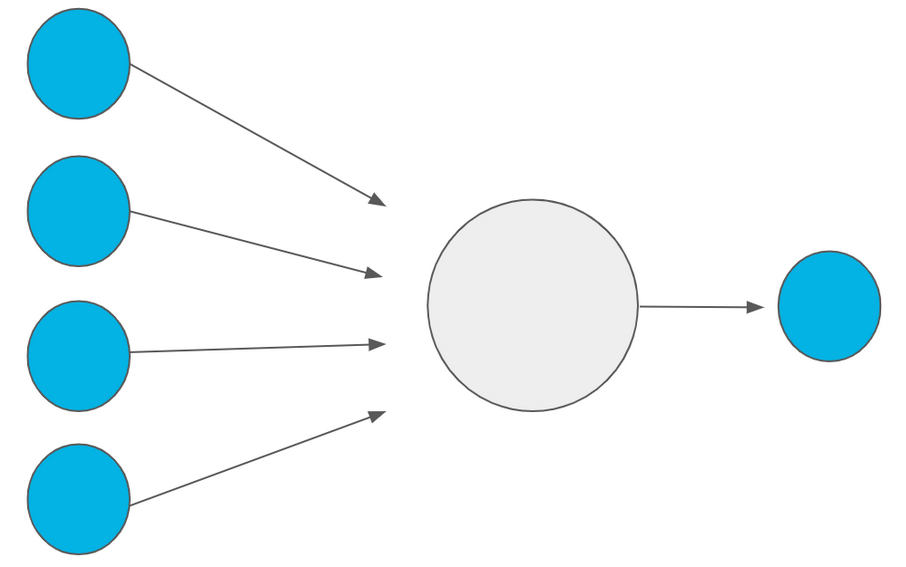